This file contains the code for producing the final figures, using the results of the analysis conducted in the *Final analysis and calculations.ipynb* file.

In [1]:
# install relevant packages
import numpy as np
import pandas as pd
import netCDF4 as nc
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.basemap import addcyclic
from mpl_toolkits.basemap import shiftgrid
from datetime import datetime
import statsmodels.api as sm
import regionmask
import xarray as xr
import cartopy.crs as ccrs
from matplotlib.patches import Polygon
from matplotlib import colors

In [2]:
%matplotlib inline

# set figure resolution
plt.rcParams['figure.dpi'] = 400
plt.rcParams['savefig.dpi'] = 400

# Trends (Figures 1, S1, S2)

Plotting the global and regional trends in the yearly 99th and 50th percentile wet-bulb temperatures. 

First, load the results and prepare for plotting.

In [3]:
# load world grid results
model_vals_99_df_2 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_percentile_linear_trends.csv')
model_vals_50_df_2 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_50_percentile_linear_trends.csv')

# convert into a grid again in order to put results on a map
coef_info_grid_99 = model_vals_99_df_2.pivot(index = 'latitude', columns = 'longitude', values = 'coef')
pval_info_grid_99 = model_vals_99_df_2.pivot(index = 'latitude', columns = 'longitude', values = 'coef_pval')
# convert to numpy arrays
coef_info_grid_99_np = coef_info_grid_99.to_numpy()
pval_info_grid_99_np = pval_info_grid_99.to_numpy()

# repeat for 50th percentile
coef_info_grid_50 = model_vals_50_df_2.pivot(index = 'latitude', columns = 'longitude', values = 'coef')
pval_info_grid_50 = model_vals_50_df_2.pivot(index = 'latitude', columns = 'longitude', values = 'coef_pval')
coef_info_grid_50_np = coef_info_grid_50.to_numpy()
pval_info_grid_50_np = pval_info_grid_50.to_numpy()

# get grid of longitudes and latitudes
lat_vals = coef_info_grid_99.index.values
lon_vals = coef_info_grid_99.columns.values
lons_2d, lats_2d = np.meshgrid(lon_vals, lat_vals) 

Print the maximum and minimum values of the coefficients for the 99th and 50th percentiles, for the full global results.

In [4]:
print(np.nanmax(coef_info_grid_99))
print(np.nanmin(coef_info_grid_99))
print(np.nanmax(coef_info_grid_50))
print(np.nanmin(coef_info_grid_50))

0.21010726301574528
-0.08383511502069882
0.20650781413819325
-0.08049785168744122


In [5]:
# load AR6 results
model_vals_ar6_weighted_mean_land_99_df_2 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_perc_ar6_avg_land_linear_trends.csv')
model_vals_ar6_weighted_mean_land_50_df_2 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_50_perc_ar6_avg_land_linear_trends.csv')

TW_99_perc_ar6_avg_all_years_land = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_perc_ar6_avg_land_all_yr_avg.csv')
TW_50_perc_ar6_avg_all_years_land = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_50_perc_ar6_avg_land_all_yr_avg.csv')
percentile_results_pd_99 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_percentile_yearly.csv')

# calculate the difference between the coefficients at 99th and 50th percentile
coef_vals_ar6_weighted_mean_land_99_df_2 = model_vals_ar6_weighted_mean_land_99_df_2.filter(items = ['region', 
                                                                                                     'coef'])
coef_vals_ar6_weighted_mean_land_99_df_2 = coef_vals_ar6_weighted_mean_land_99_df_2.rename(columns = 
                                                                                           {'coef': 'coef_99'})
coef_vals_ar6_weighted_mean_land_50_df_2 = model_vals_ar6_weighted_mean_land_50_df_2.filter(items = ['region', 
                                                                                                     'coef'])
coef_vals_ar6_weighted_mean_land_50_df_2 = coef_vals_ar6_weighted_mean_land_50_df_2.rename(columns = 
                                                                                           {'coef': 'coef_50'})
coef_vals_ar6_weighted_mean_land_99_50_df = pd.merge(coef_vals_ar6_weighted_mean_land_99_df_2, 
                                                     coef_vals_ar6_weighted_mean_land_50_df_2, 
                                                     on = ['region'])
coef_vals_ar6_weighted_mean_land_99_50_df['dif_coef'] = coef_vals_ar6_weighted_mean_land_99_50_df['coef_99'] - coef_vals_ar6_weighted_mean_land_99_50_df['coef_50']

In [6]:
# get the centroids of the AR6 regions
ar6_centroids_land = regionmask.defined_regions.ar6.land.centroids
# loop through the list of arrays of the centroids to get their x and y coordinates separately
ar6_centroids_x_land = [val[0] for val in ar6_centroids_land]
ar6_centroids_y_land = [val[1] for val in ar6_centroids_land]

In [7]:
# get latitude and longitude values
sample_vals_grid = percentile_results_pd_99[percentile_results_pd_99['year'] == 2000].pivot(index = 'latitude', 
                                                                                            columns = 'longitude', 
                                                                                            values = 'TW_percentile')
lat_vals = sample_vals_grid.index.values
lon_vals = sample_vals_grid.columns.values

# get 2d mask then set values for the coefficients and p values
mask_2d_coef_land_99 = regionmask.defined_regions.ar6.land.mask(lon_vals, lat_vals)
mask_2d_pval_land_99 = regionmask.defined_regions.ar6.land.mask(lon_vals, lat_vals)
mask_2d_coef_land_50 = regionmask.defined_regions.ar6.land.mask(lon_vals, lat_vals)
mask_2d_pval_land_50 = regionmask.defined_regions.ar6.land.mask(lon_vals, lat_vals)
mask_2d_coef_land_dif_99_50 = regionmask.defined_regions.ar6.land.mask(lon_vals, lat_vals)

# set values by looping through all the locations
coef_vals_land_99 = np.zeros(mask_2d_coef_land_99.values.shape)
pval_vals_land_99 = np.zeros(mask_2d_pval_land_99.values.shape)
coef_vals_land_50 = np.zeros(mask_2d_coef_land_50.values.shape)
pval_vals_land_50 = np.zeros(mask_2d_pval_land_50.values.shape)
coef_vals_land_dif_99_50 = np.zeros(mask_2d_coef_land_dif_99_50.values.shape)
for i in range(mask_2d_coef_land_99.values.shape[0]):
    for j in range(mask_2d_coef_land_99.values.shape[1]):
        if not np.isnan(mask_2d_coef_land_99.values[i,j]):
            # region number corresponding to this grid point
            region_num = mask_2d_coef_land_99.values[i,j]
            # fill in the respective values corresponding to that region number
            coef_vals_land_99[i,j] = model_vals_ar6_weighted_mean_land_99_df_2['coef'][int(region_num)]
            pval_vals_land_99[i,j] = model_vals_ar6_weighted_mean_land_99_df_2['coef_pval'][int(region_num)]
            coef_vals_land_50[i,j] = model_vals_ar6_weighted_mean_land_50_df_2['coef'][int(region_num)]
            pval_vals_land_50[i,j] = model_vals_ar6_weighted_mean_land_50_df_2['coef_pval'][int(region_num)]
            coef_vals_land_dif_99_50[i,j] = coef_vals_ar6_weighted_mean_land_99_50_df['dif_coef'][int(region_num)]
        else: # otherwise not in a region, fill as NA
            coef_vals_land_99[i,j] = np.nan
            pval_vals_land_99[i,j] = np.nan
            coef_vals_land_50[i,j] = np.nan
            pval_vals_land_50[i,j] = np.nan
            coef_vals_land_dif_99_50[i,j] = np.nan

# store results
mask_2d_coef_land_99.values = coef_vals_land_99
mask_2d_pval_land_99.values = pval_vals_land_99
mask_2d_coef_land_50.values = coef_vals_land_50
mask_2d_pval_land_50.values = pval_vals_land_50
mask_2d_coef_land_dif_99_50.values = coef_vals_land_dif_99_50
            
# get grid of longitudes and latitudes
lons_2d, lats_2d = np.meshgrid(lon_vals, lat_vals)

Print the maximum and minimum values of the coefficients for the 99th and 50th percentiles, for the AR6 regions results.

In [8]:
print(np.nanmax(mask_2d_coef_land_99.values))
print(np.nanmin(mask_2d_coef_land_99.values))
print(np.nanmax(mask_2d_coef_land_50.values))
print(np.nanmin(mask_2d_coef_land_50.values))
print(np.min(TW_50_perc_ar6_avg_all_years_land['weighted_mean']))
print(np.nanmin(mask_2d_coef_land_dif_99_50))

0.04132686421809932
-0.005816880562156117
0.08815540450390931
-0.004261705551430031
-36.2519163879069
-0.07121695098474136


Print the region names and numbers, for reference.

In [9]:
regionmask.defined_regions.ar6.land.regions

OrderedDict([(0,
              Region: Greenland/Iceland (GIC / 0)
              center: [-39.94636015  73.89176245]),
             (1,
              Region: N.W.North-America (NWN / 1)
              center: [-132.58828982   63.94231459]),
             (2,
              Region: N.E.North-America (NEN / 2)
              center: [-81.89507026  64.44839899]),
             (3,
              Region: W.North-America (WNA / 3)
              center: [-115.73529412   42.37647059]),
             (4,
              Region: C.North-America (CNA / 4)
              center: [-96.96601942  39.5433657 ]),
             (5,
              Region: E.North-America (ENA / 5)
              center: [-76.593361   39.7593361]),
             (6,
              Region: N.Central-America (NCA / 6)
              center: [-105.71137433   26.52492597]),
             (7,
              Region: S.Central-America (SCA / 7)
              center: [-88.73469514  13.87137109]),
             (8,
              Region: Caribbean (

Plot the results on global figures, first the 99th percentile trends.

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


Text(0.1, 0.365, 'b')

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


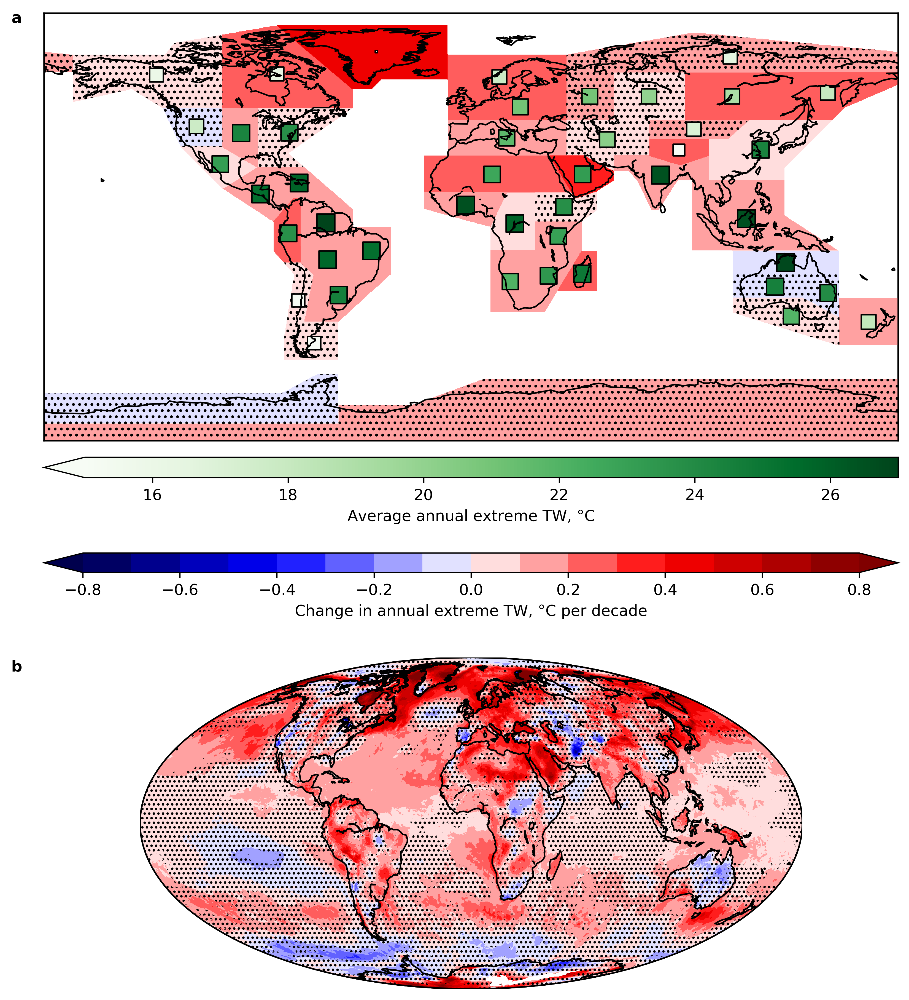

In [10]:
# plot 99th percentile results
fig, axs = plt.subplots(2, 1, figsize = [10, 12], gridspec_kw={'height_ratios': [2, 1], 'hspace': 0.01})
map_ar6_mean = Basemap(projection = 'cyl', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[0])
map_ar6_mean.drawcoastlines()
map_ar6_mean.drawmapboundary()
m_ar6_mean = map_ar6_mean.contourf(lons_2d, lats_2d, mask_2d_coef_land_99*10, np.linspace(-0.8, 0.8, num = 17), 
                                   latlon = True, cmap = 'seismic', extend = 'both')
cbar_ar6_mean = plt.colorbar(m_ar6_mean, orientation = 'horizontal', pad = 0.02, ax = axs[0], aspect = 40, 
                             extend = 'max')
cbar_ar6_mean.set_label('Change in annual extreme TW, °C per decade')
m_ar6_mean_pval = map_ar6_mean.contourf(lons_2d, lats_2d, mask_2d_pval_land_99, [0.05, 1], 
                                          colors = 'none', hatches = ['...'], latlon = True)
# add the labels for the overall average of the spatially averaged 99th percentile values for each year
m_ar6_mean_overall_avg = map_ar6_mean.scatter(ar6_centroids_x_land, ar6_centroids_y_land, 
                                              TW_99_perc_ar6_avg_all_years_land['weighted_mean']*5,
                                                c = TW_99_perc_ar6_avg_all_years_land['weighted_mean'],
                                                cmap = 'Greens',
                                                vmin = 15,
                                                vmax = 27,
                                                edgecolor = 'black',
                                                marker = 's',
                                                latlon = True)
cbar_ar6_mean_overall_avg = plt.colorbar(m_ar6_mean_overall_avg, orientation = 'horizontal', extend = 'min', 
                                         pad = 0.03, ax = axs[0], aspect = 40)
cbar_ar6_mean_overall_avg.set_label('Average annual extreme TW, °C')
# axs[0].set_title('Trends in Regionally Averaged 99th Percentile Daily Maximum Wet-Bulb Temperature')
# axs[0].set_title('a', loc = 'left', fontsize = 'medium', fontweight = 'bold')
fig.text(0.1, 0.855, 'a', ha = 'center', fontsize = 'medium', fontweight = 'bold')

map_coefs = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[1])
map_coefs.drawcoastlines()
map_coefs.drawmapboundary()
m_coefs = map_coefs.contourf(lons_2d, lats_2d, coef_info_grid_99_np*10, np.linspace(-0.8, 0.8, num = 17), 
                             latlon = True, cmap = 'seismic', extend = 'both')
# cbar_coefs = plt.colorbar(m_coefs, orientation = 'horizontal', pad = 0.03, ax = axs[1], aspect = 40)
# cbar_coefs.set_label('Coefficient, °C per decade')
m_pval = map_coefs.contourf(lons_2d, lats_2d, pval_info_grid_99_np, [0.05, 1], 
                                          colors = 'none', hatches = ['....'], latlon = True)
# axs[1].set_title('Trends in 99th Percentile Daily Maximum Wet-Bulb Temperature')
fig.text(0.1, 0.365, 'b', ha = 'center', fontsize = 'medium', fontweight = 'bold')

50th percentile.

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


Text(0.1, 0.365, 'b')

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


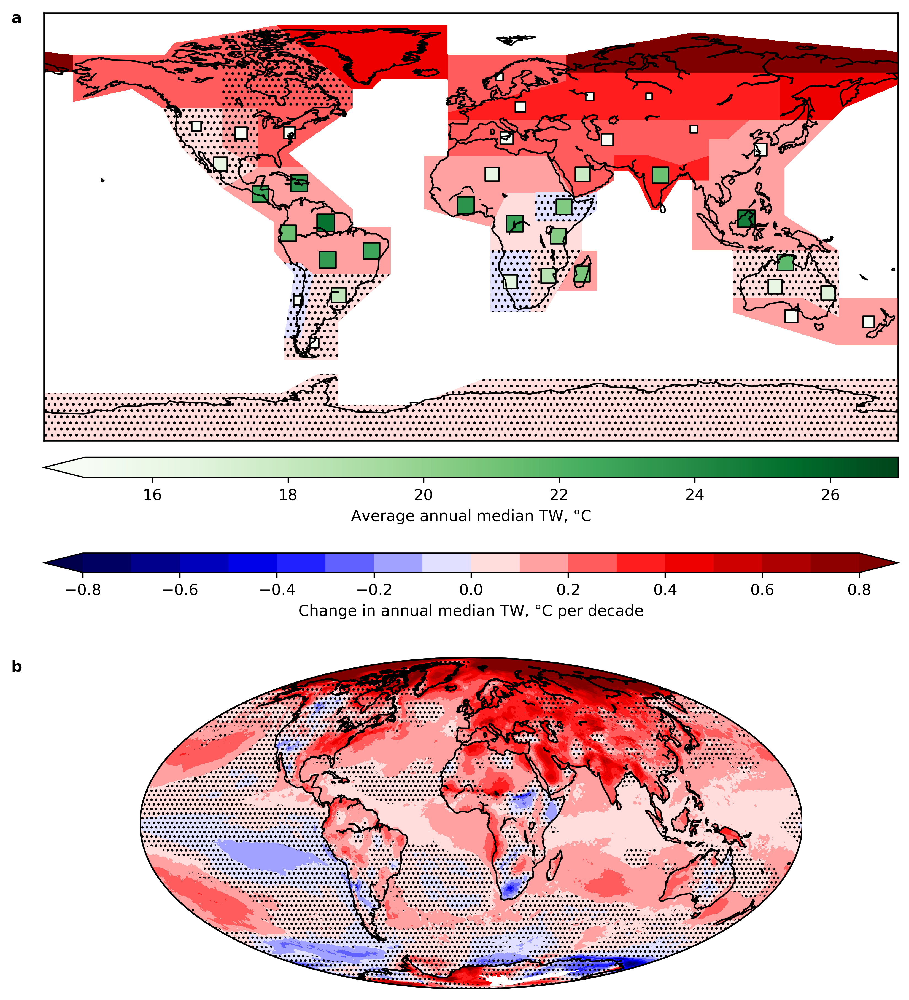

In [11]:
# 50th
fig, axs = plt.subplots(2, 1, figsize = [10, 12], gridspec_kw={'height_ratios': [2, 1], 'hspace': 0.01})
map_ar6_mean = Basemap(projection = 'cyl', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[0])
map_ar6_mean.drawcoastlines()
map_ar6_mean.drawmapboundary()
m_ar6_mean = map_ar6_mean.contourf(lons_2d, lats_2d, mask_2d_coef_land_50*10, np.linspace(-0.8, 0.8, num = 17), 
                                   latlon = True, cmap = 'seismic', extend = 'both')
cbar_ar6_mean = plt.colorbar(m_ar6_mean, orientation = 'horizontal', pad = 0.02, ax = axs[0], aspect = 40)
cbar_ar6_mean.set_label('Change in annual median TW, °C per decade')
m_ar6_mean_pval = map_ar6_mean.contourf(lons_2d, lats_2d, mask_2d_pval_land_50, [0.05, 1], 
                                          colors = 'none', hatches = ['...'], latlon = True)
# add the labels for the overall average of the spatially averaged 50th percentile values for each year
m_ar6_mean_overall_avg = map_ar6_mean.scatter(ar6_centroids_x_land, ar6_centroids_y_land, 
                                              TW_50_perc_ar6_avg_all_years_land['weighted_mean']*5,
                                                c = TW_50_perc_ar6_avg_all_years_land['weighted_mean'],
                                                cmap = 'Greens',
                                                vmin = 15,
                                                vmax = 27,
                                                edgecolor = 'black',
                                                marker = 's',
                                                latlon = True)
cbar_ar6_mean_overall_avg = plt.colorbar(m_ar6_mean_overall_avg, orientation = 'horizontal', extend = 'min', 
                                         pad = 0.03, ax = axs[0], aspect = 40)
cbar_ar6_mean_overall_avg.set_label('Average annual median TW, °C')
# axs[0].set_title('Trends in Regionally Averaged 50th Percentile Daily Maximum Wet-Bulb Temperature')
# axs[0].set_title('a', loc = 'left', fontsize = 'medium', fontweight = 'bold')
fig.text(0.1, 0.855, 'a', ha = 'center', fontsize = 'medium', fontweight = 'bold')

map_coefs = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[1])
map_coefs.drawcoastlines()
map_coefs.drawmapboundary()
m_coefs = map_coefs.contourf(lons_2d, lats_2d, coef_info_grid_50_np*10, np.linspace(-0.8, 0.8, num = 17), 
                             latlon = True, cmap = 'seismic', extend = 'max')
# cbar_coefs = plt.colorbar(m_coefs, orientation = 'horizontal', pad = 0.03, ax = axs[1], aspect = 40)
# cbar_coefs.set_label('Coefficient, °C per decade')
m_pval = map_coefs.contourf(lons_2d, lats_2d, pval_info_grid_50_np, [0.05, 1], 
                                          colors = 'none', hatches = ['....'], latlon = True)
# axs[1].set_title('Trends in 50th Percentile Daily Maximum Wet-Bulb Temperature')
fig.text(0.1, 0.365, 'b', ha = 'center', fontsize = 'medium', fontweight = 'bold')

Difference in coefficients of 99th and 50th percentile trends.

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  app.launch_new_instance()


Text(0.1, 0.365, 'b')

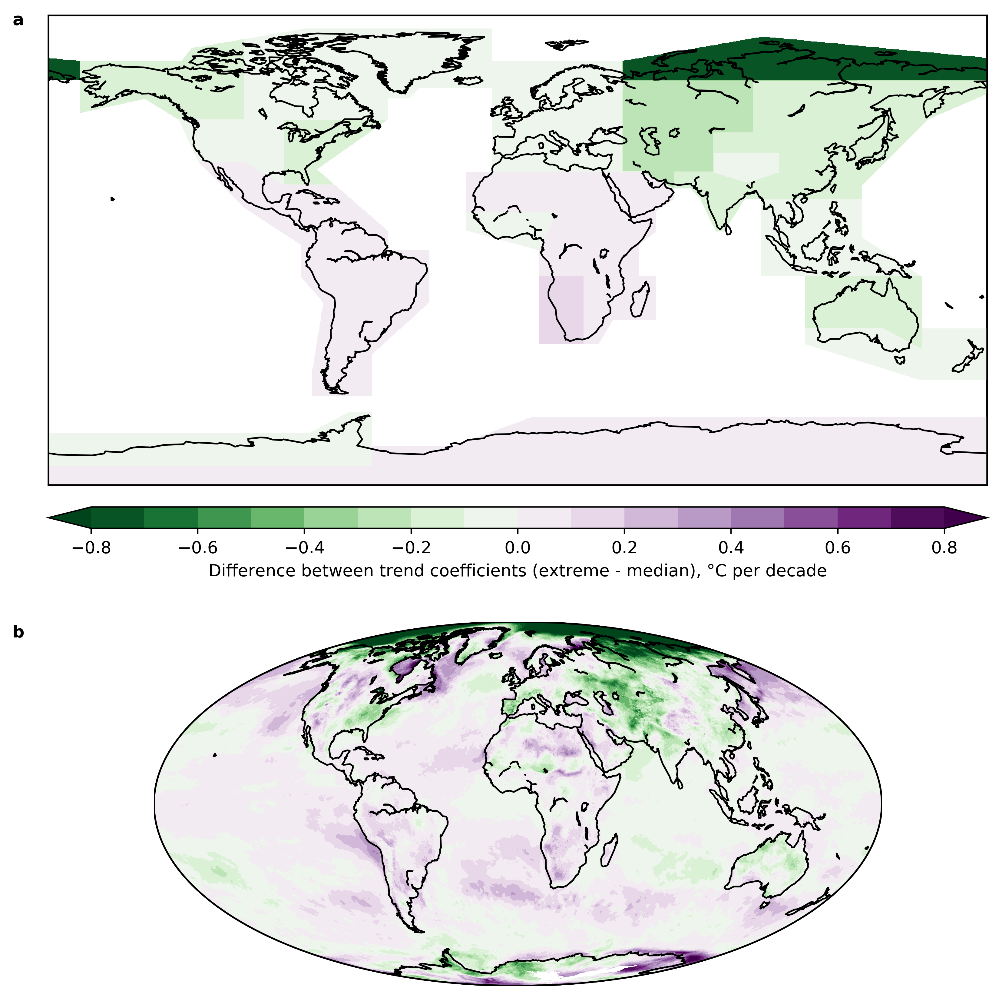

In [12]:
# difference in coefficients
fig, axs = plt.subplots(2, 1, figsize = [10, 12], gridspec_kw={'height_ratios': [2, 1], 'hspace': 0.01})
map_ar6_mean_dif = Basemap(projection = 'cyl', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[0])
map_ar6_mean_dif.drawcoastlines()
map_ar6_mean_dif.drawmapboundary()
m_ar6_mean_dif = map_ar6_mean_dif.contourf(lons_2d, lats_2d, mask_2d_coef_land_dif_99_50*10, 
                                           np.linspace(-0.8, 0.8, num = 17), latlon = True, cmap = 'PRGn_r', extend = 'both')
cbar_ar6_mean_dif = plt.colorbar(m_ar6_mean_dif, orientation = 'horizontal', pad = 0.03, ax = axs[0], aspect = 40)
cbar_ar6_mean_dif.set_label('Difference between trend coefficients (extreme - median), °C per decade')
# axs[0].set_title('Difference Between Coefficients (99th - 50th)')
# axs[0].set_title('a', loc = 'left', fontsize = 'medium', fontweight = 'bold')
fig.text(0.1, 0.786, 'a', ha = 'center', fontsize = 'medium', fontweight = 'bold')


coef_info_grid_99_50_dif_np = np.subtract(coef_info_grid_99_np, coef_info_grid_50_np)
map_coefs = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[1])
map_coefs.drawcoastlines()
map_coefs.drawmapboundary()
m_coefs = map_coefs.contourf(lons_2d, lats_2d, coef_info_grid_99_50_dif_np*10, np.linspace(-0.8, 0.8, num = 17), 
                             latlon = True, cmap = 'PRGn_r', extend = 'both')
# cbar_coefs = plt.colorbar(m_coefs, orientation = 'horizontal', ax = axs[1], pad = 0.03, aspect = 40)
# cbar_coefs.set_label('Difference, °C per decade')
fig.text(0.1, 0.365, 'b', ha = 'center', fontsize = 'medium', fontweight = 'bold')

# Interannual variability/clustering (Figure 2)

## Peak wet-bulb year and number of years to get to 75% of extreme wet-bulb days

The peak wet-bulb year is the year with the highest number of days at or above the 99th percentile. The number of years to get to 75% of extreme wet-bulb days is obtained by ranking the years by their number of days at or above the 99th percentile for each grid cell, then finding how many years down this list we need to go before we reach 75% of the days at or above the 99th percentile across all the years.

In [13]:
# read in results
year_with_max_days_at_99_perc_df = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_year_with_max_days_at_99_percentile.csv')

# convert to grid
year_with_max_days_at_99_perc_grid = year_with_max_days_at_99_perc_df.pivot(index = 'latitude', columns = 'longitude', 
                                                                      values = 'year')
# convert to numpy array
year_with_max_days_at_99_perc_grid_np = year_with_max_days_at_99_perc_grid.to_numpy()

# get grid of longitudes and latitudes
lat_vals = year_with_max_days_at_99_perc_grid.index.values
lon_vals = year_with_max_days_at_99_perc_grid.columns.values
lons_2d, lats_2d = np.meshgrid(lon_vals, lat_vals)

# load number of years results
num_years_till_75_percent_days_at_99_perc_df = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_num_years_till_75_percent_days_at_99_percentile.csv')

# convert to grid
num_years_till_75_percent_days_at_99_perc_grid = num_years_till_75_percent_days_at_99_perc_df.pivot(index = 'latitude', 
                                                                                    columns = 'longitude', 
                                                                                    values = 'num_years')
# convert to numpy array
num_years_till_75_percent_days_at_99_perc_grid_np = num_years_till_75_percent_days_at_99_perc_grid.to_numpy()


Obtain the number of weighted grid cells with each year as the top one.

In [14]:
year_counts_weighted = pd.read_csv('/dx01/sspeizer/data/final_results/year_counts_weighted.csv')

In [15]:
# get just years with >2%, based on full globe (land and ocean), to only plot those years
year_counts_weighted_top = year_counts_weighted[year_counts_weighted['frac_weighted_cells'] > 0.02].reset_index()
year_counts_weighted_top_years = year_counts_weighted_top['year']

# mask out values that are not in this list of top years 
year_with_max_days_at_99_perc_grid_np_masked_not_top = np.where(np.isin(year_with_max_days_at_99_perc_grid_np, year_counts_weighted_top_years),
                                                               year_with_max_days_at_99_perc_grid_np,
                                                                np.nan)

# get the appropriate bounds for the levels
levels_years_top = np.unique(np.append(year_counts_weighted_top_years.values - 0.5, 
                                       year_counts_weighted_top_years.values + 0.5))



/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


Text(0.1, 0.47, 'b')

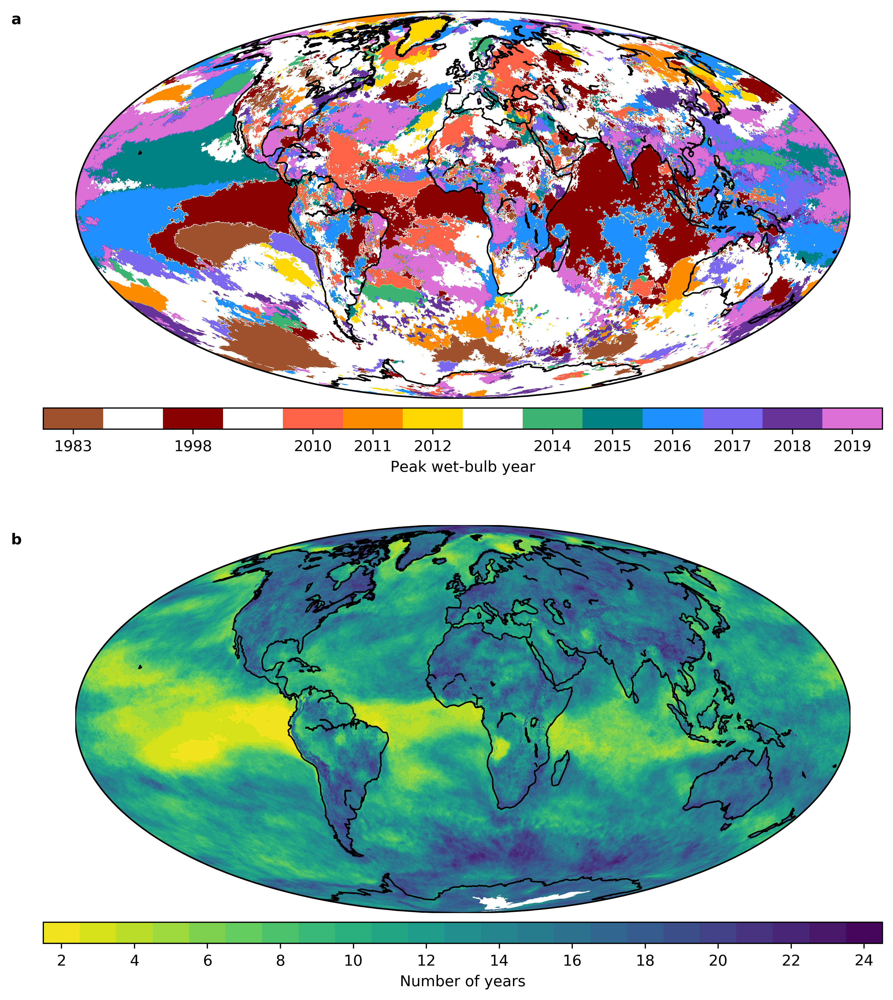

In [16]:
# plot both together
fig, axs = plt.subplots(2, 1, figsize = [10, 12], gridspec_kw={'height_ratios': [1, 1], 'hspace': 0.1})
# plot top years 
map_year2 = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[0])
map_year2.drawcoastlines()
map_year2.drawmapboundary()
m_year2 = map_year2.contourf(lons_2d, lats_2d, year_with_max_days_at_99_perc_grid_np_masked_not_top, 
                              levels_years_top, latlon = True, colors = ['sienna', 'white', 'darkred', 
                                                                         'white', 'tomato', 'darkorange', 'gold',
                                                                        'white', 'mediumseagreen', 'teal', 
                                                                         'dodgerblue', 
                                                                         'mediumslateblue', 'rebeccapurple', 'orchid'])
cbar_year2 = plt.colorbar(m_year2, orientation = 'horizontal', aspect = 40, pad = 0.02, ax = axs[0])
cbar_year2.set_label('Peak wet-bulb year')
cbar_year2.set_ticks(year_counts_weighted_top_years.values)
fig.text(0.1, 0.87, 'a', ha = 'center', fontsize = 'medium', fontweight = 'bold')

# plot years till 75%
map_year_num = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[1])
map_year_num.drawcoastlines()
map_year_num.drawmapboundary()
m_year_num = map_year_num.contourf(lons_2d, lats_2d, num_years_till_75_percent_days_at_99_perc_grid_np, 
                                   np.linspace(1.5, 24.5, 24), latlon = True, cmap = "viridis_r")
cbar_year_num = plt.colorbar(m_year_num, orientation = 'horizontal', aspect = 40, pad = 0.02, ax = axs[1])
cbar_year_num.set_label('Number of years')
cbar_year_num.set_ticks(np.linspace(2, 24, 12))
fig.text(0.1, 0.47, 'b', ha = 'center', fontsize = 'medium', fontweight = 'bold')

# Day-to-day clustering (Figure 3)

Exploring the clustering of days over the overall 99th percentile at a sub-year time frame. Specifically looking at the extreme wet-bulb concentration, or the number of days in a two-week window surrounding each 99th percentile day that are also above the 99th percentile in wet-bulb temperature.

In [17]:
# prepare for plotting
# read csv of results
TW_percentile_all_years_99 = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_percentile_overall.csv')
TW_percentile_all_years_99_np = TW_percentile_all_years_99.set_index('Unnamed: 0').to_numpy()
nearby_99_perc_days_2_week_window_summarized = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_99_perc_days_2_week_window_info_summarized.csv')
nearby_99_perc_days_2_week_window_summarized = nearby_99_perc_days_2_week_window_summarized.drop('Unnamed: 0', 
                                                                                                 axis = 'columns')
# edit percentile results and join
TW_percentile_all_years_longer = TW_percentile_all_years_99.rename(columns = {'Unnamed: 0' : 'longitude'}) 
TW_percentile_all_years_longer = pd.melt(TW_percentile_all_years_longer, id_vars = ['longitude'], var_name = 'latitude', 
                                          value_name = 'TW_99_percentile')
TW_percentile_all_years_longer['latitude'] = TW_percentile_all_years_longer['latitude'].astype(float)
# join to the data on the nearby days
nearby_99_perc_days_2_week_window_summarized_wpercs = pd.merge(nearby_99_perc_days_2_week_window_summarized, 
                                                               TW_percentile_all_years_longer, 
                                                               on = ['longitude', 'latitude'])

# convert to grid
mean_num_surrounding_99_perc_days_grid = nearby_99_perc_days_2_week_window_summarized_wpercs.pivot(index = 'latitude', 
                                                                        columns = 'longitude', 
                                                                        values = 'mean_num_surrounding_99_perc_days')
# convert to numpy array
mean_num_surrounding_99_perc_days_grid_np = mean_num_surrounding_99_perc_days_grid.to_numpy()

# get grid of longitudes and latitudes
lat_vals = mean_num_surrounding_99_perc_days_grid.index.values
lon_vals = mean_num_surrounding_99_perc_days_grid.columns.values
lons_2d, lats_2d = np.meshgrid(lon_vals, lat_vals)

# get only land values
mean_num_surrounding_99_perc_days_xar = xr.DataArray(data = mean_num_surrounding_99_perc_days_grid_np, 
                                                     dims = ['lat', 'lon'], 
                                                     coords = {'lat': lat_vals, 'lon': lon_vals})
    
# make a mask to select just the land coordinates
land_mask = regionmask.defined_regions.natural_earth.land_110.mask(mean_num_surrounding_99_perc_days_xar)
mean_num_surrounding_99_perc_days_xar_land_mask = mean_num_surrounding_99_perc_days_xar + land_mask

# define the coordinates that will be used in the TW and precipitation analysis (below, Figure 4)
afgh_lat_2 = 30.5
afgh_lon_2 = 65
sah_lat = 20
sah_lon = 27.5
nam_lat_2 = 39.25
nam_lon_2 = 244.75

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  app.launch_new_instance()


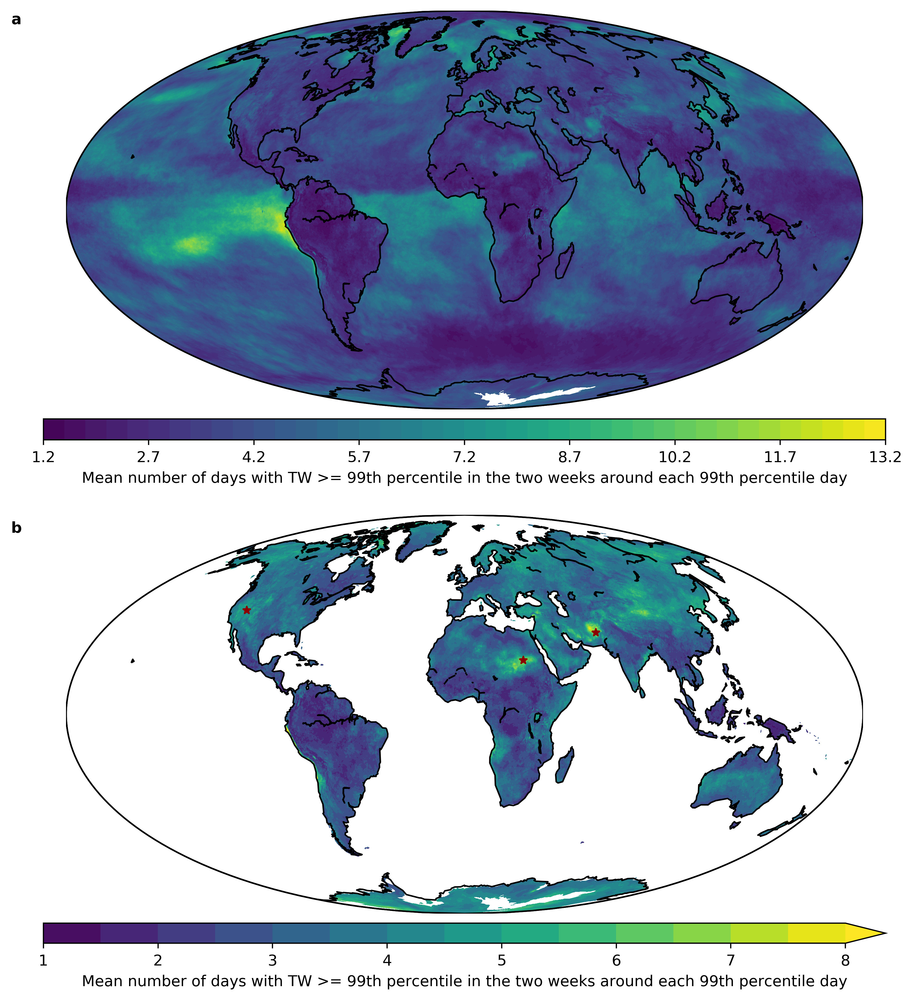

In [23]:
# plotting
# plot TW concentration figure as subplot with the two plots and with points for figure 4 labelled
fig, axs = plt.subplots(2, 1, figsize = [10, 12], gridspec_kw={'hspace': 0.05})
map_num_surrounding = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[0])
map_num_surrounding.drawcoastlines()
map_num_surrounding.drawmapboundary()
m_num_surrounding = map_num_surrounding.contourf(lons_2d, lats_2d, mean_num_surrounding_99_perc_days_grid_np, 
                                                 40, latlon = True)
cbar_num_surrounding = plt.colorbar(m_num_surrounding, orientation = 'horizontal', ax = axs[0], aspect = 40, 
                                    pad = 0.02)
cbar_num_surrounding.set_label('Mean number of days with TW >= 99th percentile in the two weeks around each 99th percentile day')

# axs[0].set_title('a', fontweight = 'bold', fontsize = 'medium', loc = 'left')
fig.text(0.1, 0.87, 'a', ha = 'center', fontsize = 'medium', fontweight = 'bold')

map_num_surrounding_land = Basemap(projection = 'moll', resolution = 'c', lat_0 = 0, lon_0 = 0, ax = axs[1])
map_num_surrounding_land.drawcoastlines()
map_num_surrounding_land.drawmapboundary()
m_num_surrounding_land = map_num_surrounding_land.contourf(lons_2d, lats_2d, mean_num_surrounding_99_perc_days_xar_land_mask, 
                                                 np.linspace(1, 8, 15), extend = 'max', latlon = True)
cbar_num_surrounding_land = plt.colorbar(m_num_surrounding_land, orientation = 'horizontal', ax = axs[1], aspect = 40,
                                        pad = 0.02)
cbar_num_surrounding_land.set_label('Mean number of days with TW >= 99th percentile in the two weeks around each 99th percentile day')
# axs[1].set_title('b', fontweight = 'bold', fontsize = 'medium', loc = 'left')
fig.text(0.1, 0.48, 'b', ha = 'center', fontsize = 'medium', fontweight = 'bold')
# plot points
point_lats = [afgh_lat_2, sah_lat, nam_lat_2]
point_lons = [afgh_lon_2, sah_lon, nam_lon_2]
m_locs = map_num_surrounding_land.scatter(point_lons, point_lats, 25, 'darkred', '*', latlon = True, ax = axs[1])
# plt.suptitle('Extreme Wet-Bulb Concentration', y = 0.92)

# Wet-bulb and precipitation for desert regions (Figure 4)

Time series of daily maximum wet-bulb temperatures and precipitation for regions with high extreme wet-bulb concentrations. These locations were defined above, but code to define them again is included here (commented out) for clarity.

In [24]:
# # define the coordinates - done previously, so commented out
# afgh_lat_2 = 30.5
# afgh_lon_2 = 65
# sah_lat = 20
# sah_lon = 27.5
# nam_lat_2 = 39.25
# nam_lon_2 = 244.75

# find the top years with the maximum number of 99th percentile days for the Afghanistan, Sahara, and North America
# locations 
yearly_days_at_99_perc = pd.read_csv('/dx01/sspeizer/data/final_results/ERA5_TW_daily_max_days_at_overall_99_percentile_yearly.csv')
yearly_days_at_99_perc_sah = yearly_days_at_99_perc[(yearly_days_at_99_perc['latitude'] == sah_lat) & 
                (yearly_days_at_99_perc['longitude'] == sah_lon)].sort_values(by = 'num_at_or_above').reset_index()
sah_year_1 = yearly_days_at_99_perc_sah['year'][len(yearly_days_at_99_perc_sah['year']) - 1]
sah_year_2 = yearly_days_at_99_perc_sah['year'][len(yearly_days_at_99_perc_sah['year']) - 2]

yearly_days_at_99_perc_nam_2 = yearly_days_at_99_perc[(yearly_days_at_99_perc['latitude'] == nam_lat_2) & 
                (yearly_days_at_99_perc['longitude'] == nam_lon_2)].sort_values(by = 'num_at_or_above').reset_index()
nam_2_year_1 = yearly_days_at_99_perc_nam_2['year'][len(yearly_days_at_99_perc_nam_2['year']) - 1]
nam_2_year_2 = yearly_days_at_99_perc_nam_2['year'][len(yearly_days_at_99_perc_nam_2['year']) - 2]

yearly_days_at_99_perc_afgh_2 = yearly_days_at_99_perc[(yearly_days_at_99_perc['latitude'] == afgh_lat_2) & 
                (yearly_days_at_99_perc['longitude'] == afgh_lon_2)].sort_values(by = 'num_at_or_above').reset_index()
afgh_2_year_1 = yearly_days_at_99_perc_afgh_2['year'][len(yearly_days_at_99_perc_afgh_2['year']) - 1]
afgh_2_year_2 = yearly_days_at_99_perc_afgh_2['year'][len(yearly_days_at_99_perc_afgh_2['year']) - 2]


In [25]:
# function to obtain and plot the TW and precipitation data for (input_lat, input_lon) in the given year. y_max sets
# the maximum y value of the summer only plot, if not 0 (if 0, uses default). plots on input fig and axs at the
# given loc_axs_row row and loc_axs_col column. uses consistent y axis scales between the two plots for each place
def plot_TW_and_precip_set_y(input_lat, input_lon, year, y_max, fig, axs, loc_axs_row, loc_axs_col):
    # load TW data
    TW_data = nc.Dataset('/dx01/data/ERA5/humid_heat/TW_daily_max_ERA5_historical_an-sfc_%s_0UTC.nc' % year)
    TWs = TW_data.variables['TW'][:]
    
    # load precip data
    precip_data = nc.Dataset('/dx01/data/ERA5/precip_dailytotal/precip_dailytotal_%s.nc' % year)
    precip = precip_data.variables['tp'][:]
    
    # get number of days in the year
    num_days = 365 
    if (year % 4 == 0):
        num_days = 366
    
    # select just this location's data
    TWs_curr = TWs[:, np.where(lons == input_lon), np.where(lats == input_lat)].reshape(num_days)
    precip_curr = precip[:, np.where(lats == input_lat), np.where(lons == input_lon)].reshape(num_days)

    # get the 99th percentile TW value in this location
    TW_99_curr = nearby_99_perc_days_2_week_window_summarized_wpercs[(nearby_99_perc_days_2_week_window_summarized_wpercs['latitude'] == input_lat) & 
                                                                (nearby_99_perc_days_2_week_window_summarized_wpercs['longitude'] == input_lon)]
    TW_99_curr = TW_99_curr.reset_index()['TW_99_percentile'][0]
    
    # overlay the plots
    axs[loc_axs_row, loc_axs_col].plot(TWs_curr[(num_days - 214):(num_days - 114)])
    axs[loc_axs_row, loc_axs_col].plot(np.repeat(TW_99_curr, 100))
    axs[loc_axs_row, loc_axs_col].set_title('%s°N, %s°E in %s' % (input_lat, input_lon, year))
    axs[loc_axs_row, loc_axs_col].tick_params(axis = 'y', colors = 'tab:blue')
    ax2 = axs[loc_axs_row, loc_axs_col].twinx()
    ax2.plot(precip_curr[(num_days - 214):(num_days - 114)]*1000, 'g')
    ax2.tick_params(axis = 'y', colors = 'darkgreen')
    # set the maximum y value of the precipitation scale for the summer plot
    if (y_max != 0):
        ax2.set_ylim([-(y_max) / 90, y_max])
    # only set the left axis title if it is the left plot, also remove right y labels
    if (loc_axs_col == 0):
#         axs[loc_axs_row, loc_axs_col].set_ylabel('Maximum wet-bulb temperature, °C')
        ax2.set_yticklabels([])
#     # only set the right axis title if it is the right plot
#     if (loc_axs_col == 1):
#         ax2.set_ylabel('Precipitation, mm')
#     # only set the x axis label if it is the bottom row
#     if (loc_axs_row == 2):
#         axs[loc_axs_row, loc_axs_col].set_xlabel('Day since June 1st')

Text(0.965, 0.5, 'Precipitation, mm')

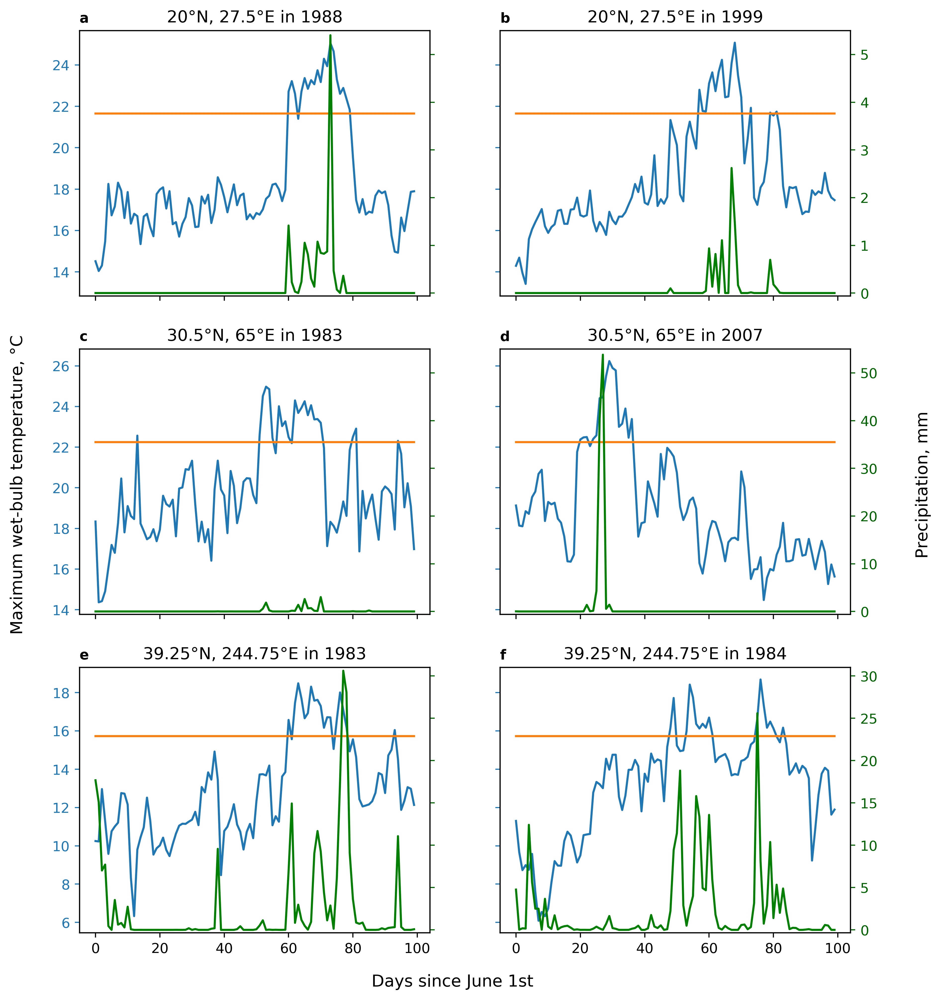

In [26]:
# plotting
# get latitude and longitude values from one file that is in the set for all the years
curr_filename = '/dx01/data/ERA5/humid_heat/TW_daily_max_ERA5_historical_an-sfc_2000_0UTC.nc'
# load the data for this year
curr_data = nc.Dataset(curr_filename)
lat_info = curr_data.variables['latitude']
lats = lat_info[:]
lon_info = curr_data.variables['longitude']
lons = lon_info[:]

# plot
fig, axs = plt.subplots(3, 2, figsize = [10, 12], sharex = 'all', sharey = 'row')
plot_TW_and_precip_set_y(sah_lat, sah_lon, sah_year_1, 5.5, fig, axs, 0, 0)
plot_TW_and_precip_set_y(sah_lat, sah_lon, sah_year_2, 5.5, fig, axs, 0, 1)
plot_TW_and_precip_set_y(afgh_lat_2, afgh_lon_2, afgh_2_year_1, 55, fig, axs, 1, 0)
plot_TW_and_precip_set_y(afgh_lat_2, afgh_lon_2, afgh_2_year_2, 55, fig, axs, 1, 1)
plot_TW_and_precip_set_y(nam_lat_2, nam_lon_2, nam_2_year_1, 31, fig, axs, 2, 0)
plot_TW_and_precip_set_y(nam_lat_2, nam_lon_2, nam_2_year_2, 31, fig, axs, 2, 1)
axs[0, 0].set_title('a', loc = 'left', fontsize = 'medium', fontweight = 'bold')
axs[0, 1].set_title('b', loc = 'left', fontsize = 'medium', fontweight = 'bold')
axs[1, 0].set_title('c', loc = 'left', fontsize = 'medium', fontweight = 'bold')
axs[1, 1].set_title('d', loc = 'left', fontsize = 'medium', fontweight = 'bold')
axs[2, 0].set_title('e', loc = 'left', fontsize = 'medium', fontweight = 'bold')
axs[2, 1].set_title('f', loc = 'left', fontsize = 'medium', fontweight = 'bold')
# fig.suptitle('Daily Maximum Wet-Bulb Temperature and Total Precipitation', fontsize = 'x-large', y = 0.93)
fig.text(0.5, 0.08, 'Days since June 1st', ha = 'center', fontsize = 'large')
fig.text(0.055, 0.5, 'Maximum wet-bulb temperature, °C', rotation = 'vertical', va = 'center', fontsize = 'large')
fig.text(0.965, 0.5, 'Precipitation, mm', rotation = 'vertical', va = 'center', fontsize = 'large')